In [1]:
import time
import copy
import glob

import _lzma
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

import matplotlib.pyplot as plt

In [2]:
from torchsummary import summary

In [3]:
resnet18 = models.resnet18(pretrained=True)

/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
# Freeze all the layers in the model (equivalent to setting trainable = False in TensorFlow)
for param in resnet18.parameters():
    param.requires_grad = False

# Remove the fully connected layer (equivalent to include_top=False)
model = nn.Sequential(
    *list(resnet18.children())[:-1],
    nn.AdaptiveMaxPool2d(1)  # Global Max Pooling
)

# Display the model summary
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
# Load the pretrained ResNet18 model
resnet18 = models.resnet18(pretrained=True)

# Freeze all the layers in the model (equivalent to setting trainable=False in TensorFlow)
for param in resnet18.parameters():
    param.requires_grad = False

# Remove the fully connected layer (equivalent to include_top=False in TensorFlow)
resnet18 = nn.Sequential(
    *list(resnet18.children())[:-1],  # Removing the fully connected (FC) layer
    nn.AdaptiveMaxPool2d(1)           # Apply Global Max Pooling
)

# Display the model summary (with input size (3, 224, 224))
summary(resnet18, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
from PIL import Image
import numpy as np

# Load the image
img = Image.open('9987.jpg')

# Define the preprocessing transform: Resize, Convert to Tensor, Normalize (ImageNet standards)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize to ImageNet mean and std
])

# Apply the transformations to the image
img_tensor = transform(img)

# Add batch dimension (unsqueeze to simulate batch size of 1)
img_tensor = img_tensor.unsqueeze(0)



# Set model to evaluation mode
resnet18.eval()

# Make prediction (forward pass)
with torch.no_grad():  # Disable gradient calculation for inference
    output = resnet18(img_tensor)

# Flatten the result (similar to .flatten() in Keras)
result = output.flatten()

# Normalize the result (similar to norm(result) in Keras)
norm_result = result / torch.norm(result)

# Convert to numpy if needed
norm_result_numpy = norm_result.numpy()

# Print the normalized result
print(norm_result_numpy)


[3.71690956e-03 3.05113313e-03 4.27421415e-04 1.34159818e-01
 4.60943382e-04 1.86543800e-02 2.27597222e-04 1.98854804e-02
 9.72665027e-02 1.41345207e-02 2.30813306e-02 6.96669426e-03
 3.04209045e-03 2.61834040e-02 3.85167077e-04 3.00650019e-03
 1.55168036e-02 2.09493097e-03 3.47224530e-03 0.00000000e+00
 6.50691218e-04 1.59258638e-02 1.18705444e-02 3.51327285e-03
 3.72589013e-04 1.80720550e-03 1.49874557e-02 3.40929143e-02
 3.45029216e-03 2.07159854e-02 7.19303440e-04 1.12635607e-03
 3.38847712e-02 3.66399884e-02 1.43989190e-01 1.62507016e-02
 3.01256683e-02 0.00000000e+00 2.48725004e-02 2.48674341e-02
 1.43928628e-03 7.83188362e-03 3.28293145e-02 5.63282229e-05
 3.98675986e-02 2.60199956e-03 4.21755947e-02 0.00000000e+00
 9.26478431e-02 3.51679474e-02 9.52732489e-02 3.40595804e-02
 2.78487569e-03 7.30505679e-03 6.19826317e-02 5.15180677e-02
 5.00877807e-03 9.65099484e-02 3.53863556e-03 3.47959367e-03
 1.44995619e-02 3.90218827e-03 2.24391487e-03 4.05287184e-03
 4.29139324e-02 1.563962

In [ ]:
filenames = []
for file in os.listdir('images'):
    filenames.append(os.path.join('images',file))

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np

def extract_features_from_image(image_path, model):
    # Load the image
    img = Image.open(image_path)

    # Define the preprocessing transform: Resize, Convert to Tensor, Normalize (ImageNet standards)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize image to 224x224
        transforms.ToTensor(),          # Convert to tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize to ImageNet mean and std
    ])

    # Apply the transformations to the image
    img_tensor = transform(img)

    # Add batch dimension (unsqueeze to simulate batch size of 1)
    img_tensor = img_tensor.unsqueeze(0)



    # Set model to evaluation mode
    resnet18.eval()

    # Make prediction (forward pass)
    with torch.no_grad():  # Disable gradient calculation for inference
        output = resnet18(img_tensor)

    # Flatten the result (similar to .flatten() in Keras)
    result = output.flatten()

    # Normalize the result (similar to norm(result) in Keras)
    norm_result = result / torch.norm(result)

    # Convert to numpy if needed
    norm_result_numpy = norm_result.numpy()

    return norm_result_numpy


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("paramaggarwal/fashion-product-images-dataset")

print("Path to dataset files:", path)

Resuming download from 3140485120 bytes (21630730620 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/paramaggarwal/fashion-product-images-dataset?dataset_version_number=1 (3140485120/24771215740) bytes left.


100%|██████████| 23.1G/23.1G [08:41<00:00, 41.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/paramaggarwal/fashion-product-images-dataset/versions/1


In [ ]:
import os

In [ ]:
filenames = []
for file in os.listdir(path+'/fashion-dataset/images'):
  final_path = os.path.join(path+'/fashion-dataset/images',file)
  filenames.append(final_path)


In [ ]:
len(filenames)

44441

In [ ]:
var = extract_features_from_image('/content/9987.jpg', resnet18)

In [ ]:
var

array([3.71690956e-03, 3.05113313e-03, 4.27421415e-04, 1.34159818e-01,
       4.60943382e-04, 1.86543800e-02, 2.27597222e-04, 1.98854804e-02,
       9.72665027e-02, 1.41345207e-02, 2.30813306e-02, 6.96669426e-03,
       3.04209045e-03, 2.61834040e-02, 3.85167077e-04, 3.00650019e-03,
       1.55168036e-02, 2.09493097e-03, 3.47224530e-03, 0.00000000e+00,
       6.50691218e-04, 1.59258638e-02, 1.18705444e-02, 3.51327285e-03,
       3.72589013e-04, 1.80720550e-03, 1.49874557e-02, 3.40929143e-02,
       3.45029216e-03, 2.07159854e-02, 7.19303440e-04, 1.12635607e-03,
       3.38847712e-02, 3.66399884e-02, 1.43989190e-01, 1.62507016e-02,
       3.01256683e-02, 0.00000000e+00, 2.48725004e-02, 2.48674341e-02,
       1.43928628e-03, 7.83188362e-03, 3.28293145e-02, 5.63282229e-05,
       3.98675986e-02, 2.60199956e-03, 4.21755947e-02, 0.00000000e+00,
       9.26478431e-02, 3.51679474e-02, 9.52732489e-02, 3.40595804e-02,
       2.78487569e-03, 7.30505679e-03, 6.19826317e-02, 5.15180677e-02,
      

In [ ]:
image_features = []
for file in filenames:
    image_features.append(extract_features_from_image(file, resnet18))
image_features

[array([3.20789106e-02, 5.74710667e-02, 4.18897606e-02, 1.41593907e-02,
        3.40475526e-04, 1.08592920e-01, 2.75311489e-02, 6.10750727e-02,
        9.18806717e-02, 3.29586565e-02, 6.52116761e-02, 2.11246833e-02,
        1.07418699e-02, 4.82681766e-03, 3.87231517e-03, 8.21099244e-03,
        2.42762249e-02, 4.64836247e-02, 8.44156893e-05, 3.99154116e-04,
        7.62135955e-04, 3.12348758e-03, 6.04039133e-02, 4.24009450e-02,
        1.20780515e-02, 1.72525384e-02, 1.04650427e-02, 6.98138699e-02,
        5.32917073e-03, 2.61828583e-02, 2.38537323e-02, 1.45191569e-02,
        2.64315344e-02, 7.25855678e-03, 7.32307695e-03, 6.21752534e-03,
        2.17635464e-02, 7.18536694e-03, 1.19849145e-02, 7.26378849e-03,
        3.91445197e-02, 2.35908795e-02, 5.36394976e-02, 3.73277045e-03,
        8.15932229e-02, 3.68970010e-04, 5.78266848e-03, 1.45650702e-03,
        6.70661107e-02, 2.43442748e-02, 2.97089666e-02, 2.83568986e-02,
        6.58026291e-03, 9.76778683e-04, 1.98202908e-01, 4.280775

In [23]:
len(image_features)

44441

In [25]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import pickle as pkl

In [26]:
Image18_features = pkl.dump(image_features, open('Images18_features.pkl','wb'))

In [27]:
filenames18 = pkl.dump(filenames, open('filenames18.pkl','wb'))

In [28]:
Image18_features = pkl.load(open('Images18_features.pkl','rb'))

In [29]:
filenames18 = pkl.load(open('filenames18.pkl','rb'))

In [30]:
np.array(Image18_features).shape

(44441, 512)

In [31]:
#Finding Neighboring images

neighbors = NearestNeighbors(n_neighbors=6, algorithm='brute', metric='euclidean')
neighbors.fit(Image18_features)

NearestNeighbors(algorithm='brute', metric='euclidean', n_neighbors=6)

In [33]:
input_image = extract_features_from_image('9987.jpg',resnet18)

In [34]:
distance,indices = neighbors.kneighbors([input_image])

In [35]:

from IPython.display import Image

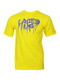

In [37]:
#target image

Image('9987.jpg')

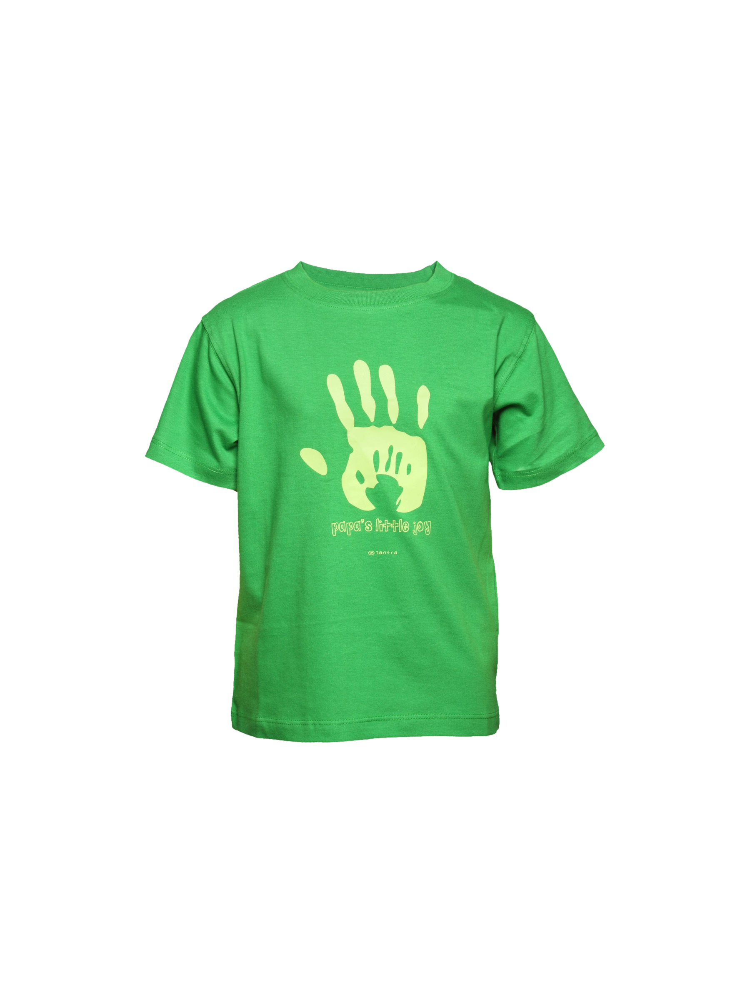

In [38]:
#nearest neighbors based on embeddings/features

Image(filenames18[indices[0][1]])

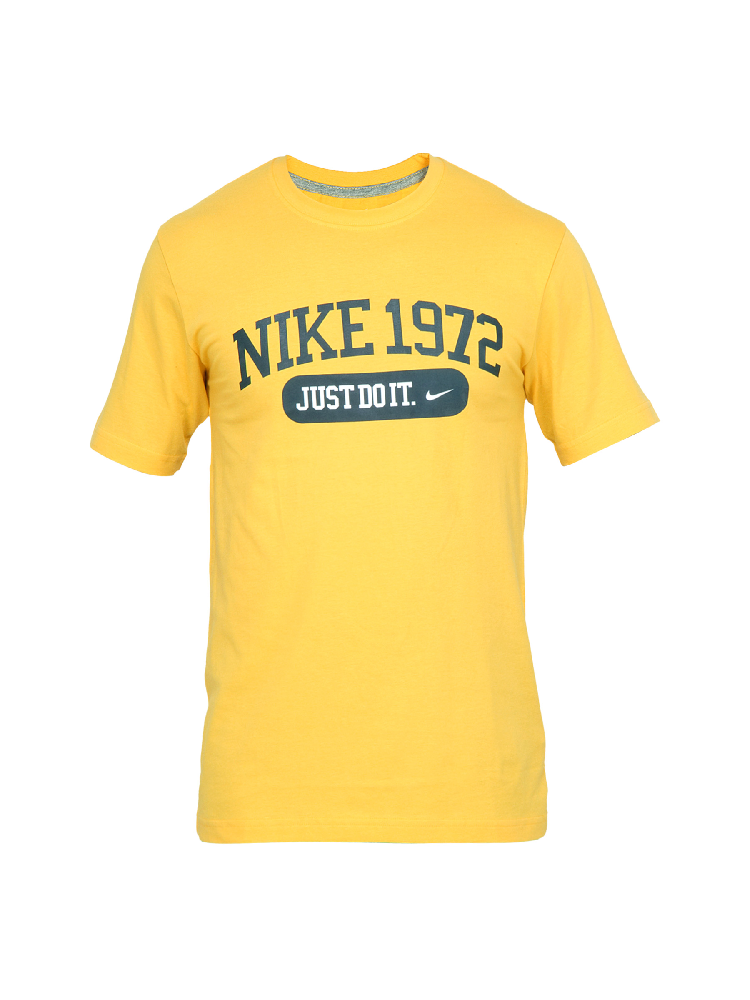

In [39]:
Image(filenames18[indices[0][2]])

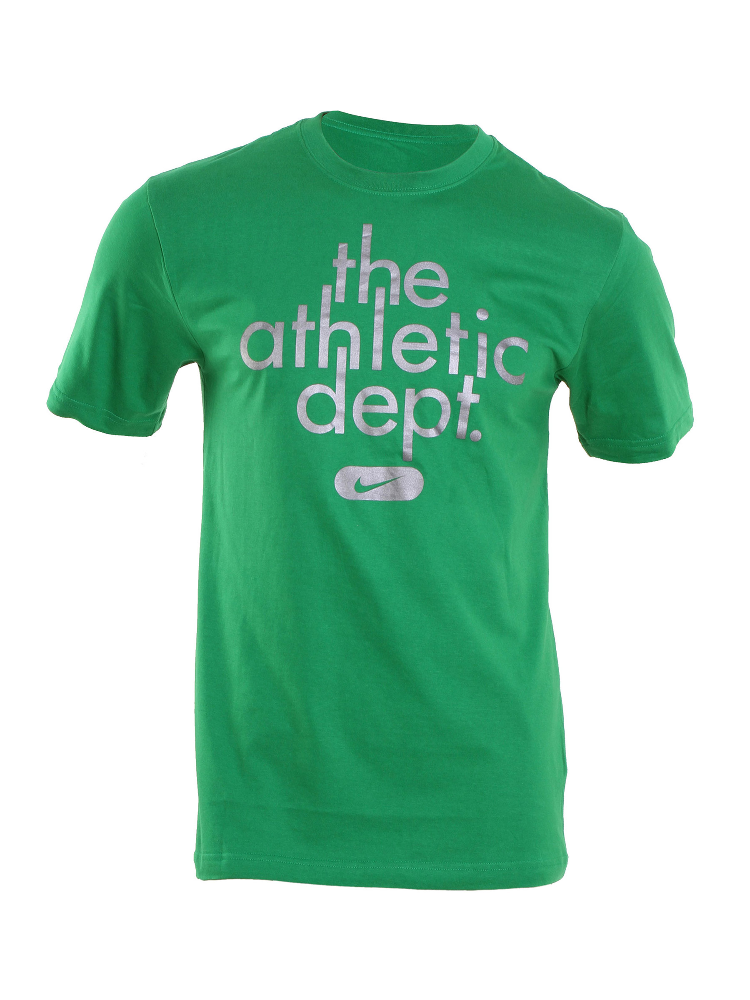

In [40]:
Image(filenames18[indices[0][3]])

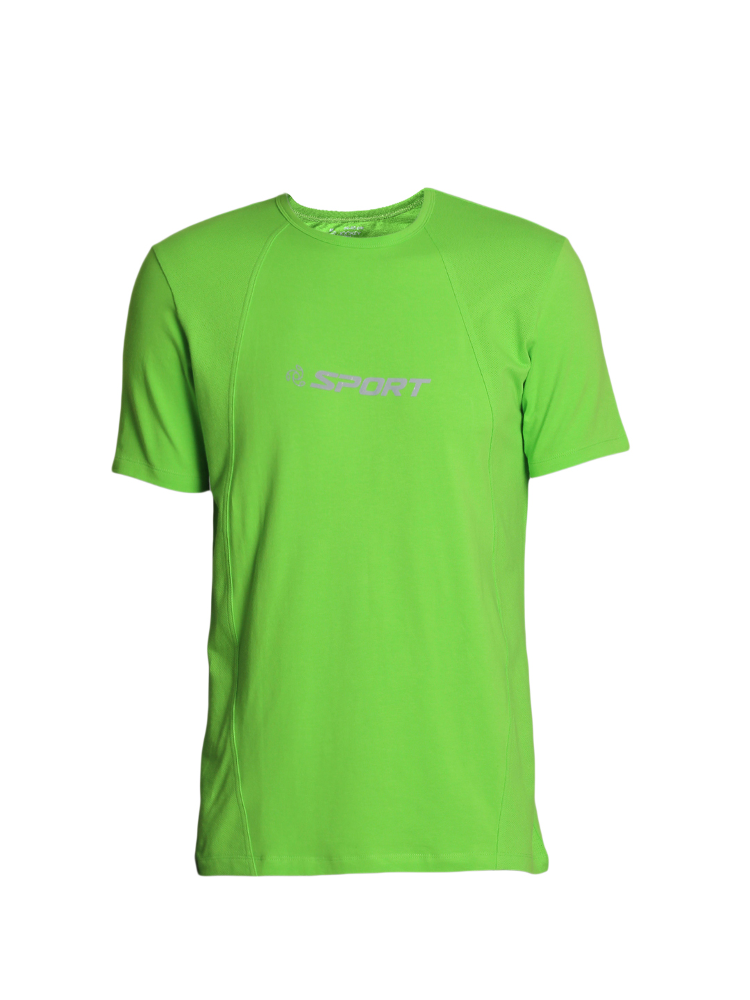

In [41]:
Image(filenames18[indices[0][4]])

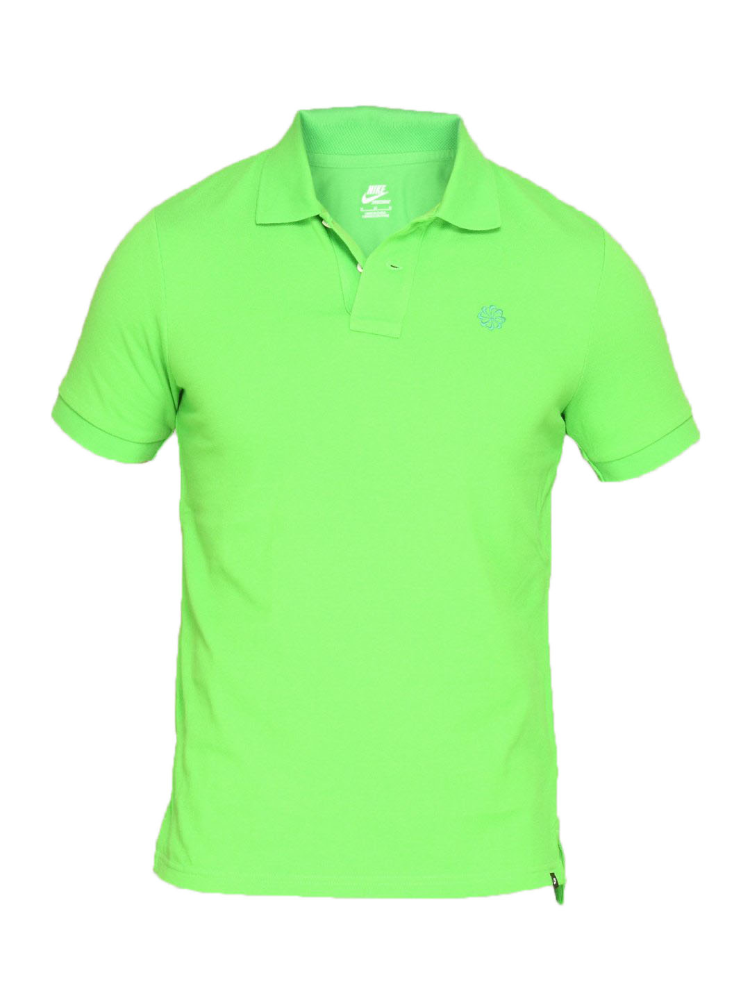

In [43]:
Image(filenames18[indices[0][5]])